# Leren a.d.h.v. lineaire Modellen
### K. Verbeeck, T. Vermeulen, J. Maervoet
Data Science (Theory) -- OGI02i

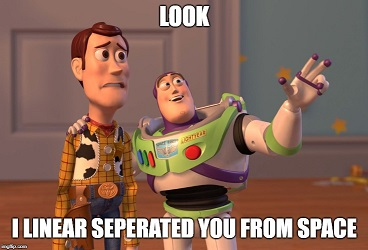

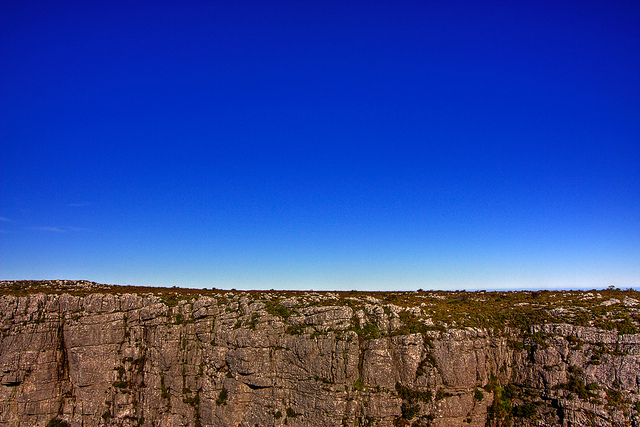

### Supervised Machine Learning

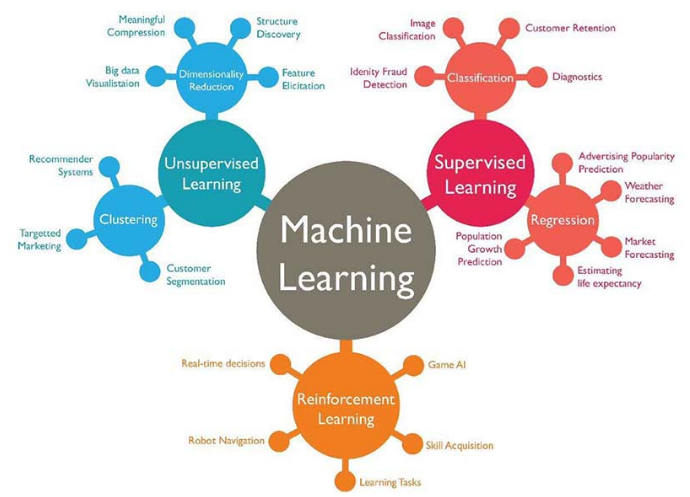

### Classification & Regression


> __Classificatie__ is een ML taak waarbij een label voorspeld moet worden uit een mogelijke lijst van antwoorden.

> Wanneer er slechts 2 mogelijke labels zijn dan noemt men dit __binaire classificatie__

Voorbeeld : je spam filter : een mail is spam of ham - je lost in dit geval een ja/nee vraag op

> Wanneer er meerdere labels mogelijk zijn dan noemt men dit __multiclass classificatie__

Voorbeeld : herkennen van handgeschreven cijfers - het antwoord kan zijn : 0,1,...,9




> __Regressie__ is een ML taak waarbij een cijfer (continue waarde) voorspeld moet worden 

Voorbeeld : iemand zijn leeftijd voorspellen, iemand zijn jaarlijks inkomen voorspellen, ...


### Lineaire modellen voor Regressie 

#### Waar komt de term regressie vandaan ?
De Engelse antropoloog Francis Galton ontdekte dat kinderen uitzonderlijke eigenschappen 
van hun ouders overerven, maar dat er wel een trend van _regressie naar het midden_ bestaat. 
Lange ouders krijgen bijvoorbeeld lange kinderen en korte ouders korte kinderen, echter steeds minder nadrukkelijk. Galton noemde de analysemethode die hij gebruikte naar het door hem bestudeerde fenomeen: regressie. (from <https://deafstudeerconsultant.nl/regressie-analyse-beginners/>)

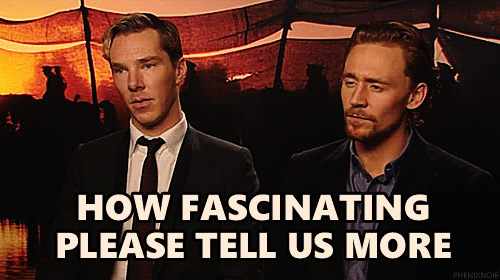

Regressie = 

> Als twee variabelen gecorreleerd zijn (ze veranderen samen), dan kan je de onafhankelijke variabele (degene die beïnvloed) gebruiken om de afhankelijke variabele (degene die wordt beïnvloed) te voorspellen. Dit voorspellingsmodel kan een rechte zijn (een lineair verband) men spreekt dan over **lineaire regressie**. 

Voorbeelden : 
* je kan lengte gebruiken om het gewicht te voorspellen.
* de temperatuur om het aantal verkochte ijsjes te voorspellen

> Als er meerdere voorspellende variabelen zijn, dan spreken we over **meervoudige lineaire regressie** indien er slechts 2 zijn dan spreken we over **enkelvoudige lineaire regressie**.

> Men zegt : lineaire regressie voorspelt de waarde van een afhankelijke variabele op basis van de waarde van een (of meer) onafhankelijke variabele(n) (ook wel verklarende of voorspellende variabelen genoemd).

 


### De taak van regressie is voornamelijk om **voorspellingen** te maken 

#### Let op: een lineair verband is niet altijd zinnig : correlatie leidt niet altijd naar causaliteit (oorzaak)

#### Dringende nood aan meer piraten om de opwarming van de aarde aan te pakken???

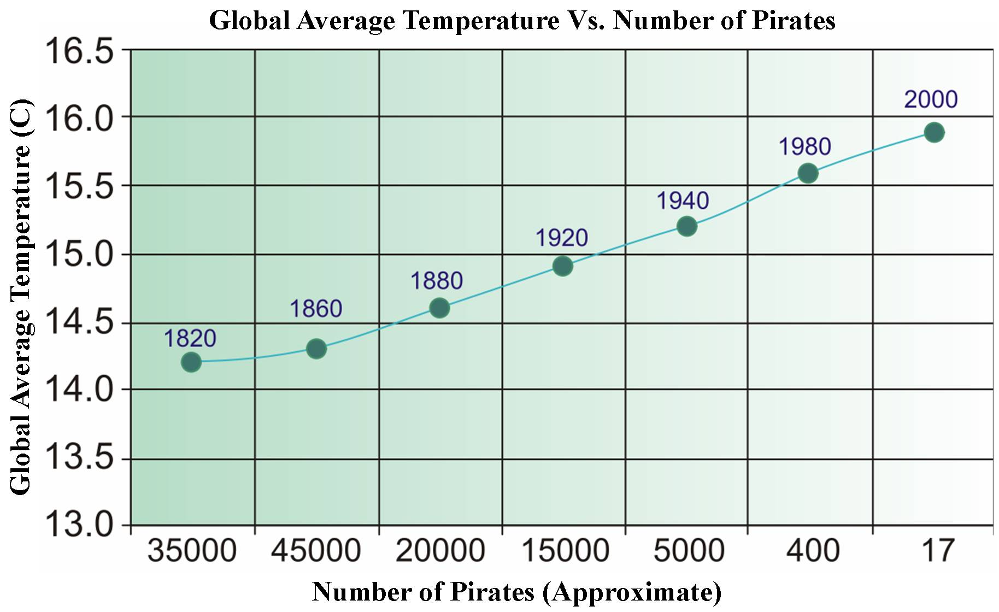

In een ML setting :

* de onafhankelijke variabelen zijn **de features** die de data beschrijven
(zie Iris data set - 4 features: petal length, petal width, sepal length, sepal width)

* de afhankelijke variabele = **de target** =  de waarde die voorspeld moet worden

* hoe weet je of de relatie tussen onafhankelijke en afhankelijke variabelen lineair is? -> zie **Bias**

### Model representatie van enkelvoudige lineaire regressie = de vergelijking van een rechte

Lineaire regressie heeft een simpel model representatie met weinig parameters nml. een rechte :


\begin{equation}
y = a_0 + a_1 * x  
\end{equation}

Hierbij is $y$ = de target, $x$ = de enige **feature** en $a_0, a_1$ de **parameters** van het model. Om de rechte te zoeken die de relatie tussen $x$ en $y$ modelleert, volstaat het dus om op zoek te gaan naar $a_0$ en $a_1$.
Betekenis van deze parameters :
- $a_0$ = **intercept**: deze geeft aan wat het startpunt van de lijn is bij x = 0 (dus het punt waar de lijn de y-as kruist, daarom ook wel de y-intercept genoemd).
- $a_1$ = **helling** : deze geeft aan hoe stijl de rechte is





helling en intercept :

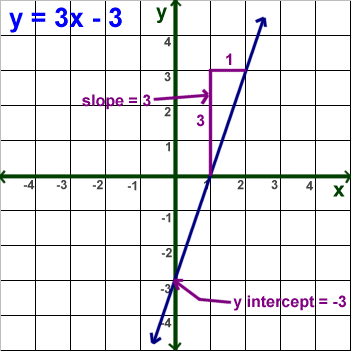

Zoek de juist rechte :

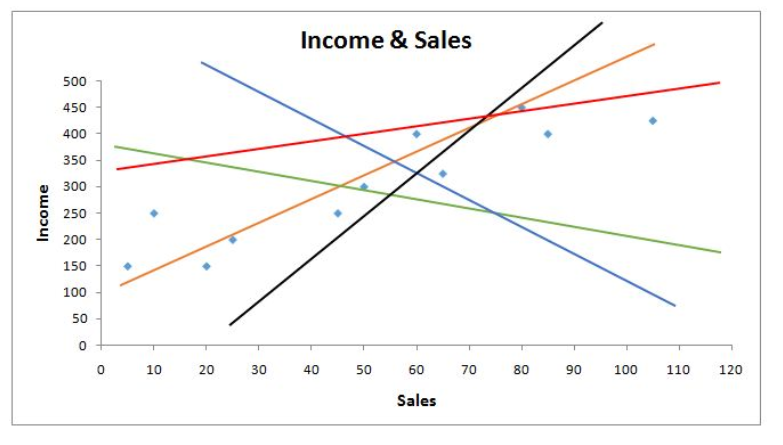


### Model representatie van meervoudige lineaire regressie = de vergelijking van een hypervlak

* In het geval van meervoudige lineaire regressie met n onafhankelijke variabelen : 
    model = een vlak in **n-dimensionale ruimte** :

\begin{equation}
y = a_0 + a_1 * x_1 + a_2 * x_2 , \ldots , + a_n * x_n 
\end{equation}

Hierbij blijft $y$ = **de target**, $x_1,\ldots,x_n$ = de $n$ **eatures** en $a_0,\ldots,a_n$ de **parameters** van het model. In dit geval moeten de parameters $a_1 \ldots a_n$ gezocht worden om de vergelijking van een hoger dimensioneel vlak (= **hypervlak**) te vinden. 


3D hypervlak
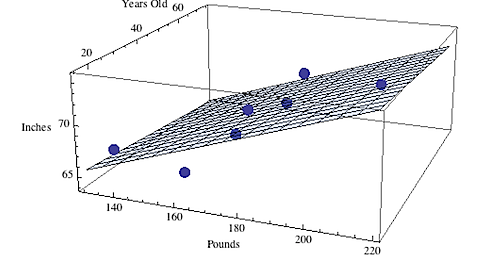

### Kost-functie 

Een kost functie berekent de error tussen geschatte en werkelijke waarden. Deze moet dus **geminimaliseerd** worden. Meestal wordt er gekozen voor de **Mean Squared Error** functie (methode van de kleinste kwadraten) :

\begin{equation}
MSE = \frac{1}{n} \sum_{i=1}^{n} (y_i - pred_i)^2 
\end{equation}

**Taak** : Zoek de waarden $a_0 \ldots a_n$ zodat de $MSE$ functie minimaal is. De leertaak is m.a.w. omgezet naar een taak van zoeken dankzij de keuze van de representatie !

\begin{equation}
MIN(MSE) = MIN(\frac{1}{n} \sum_{i=1}^{grootte\;datset} (y_i - \sum_{j=0}^{n=nr features} a_j * x_{ij})^2 )
\end{equation}


#### Verschillen tussen geschatte en werkelijke waarden


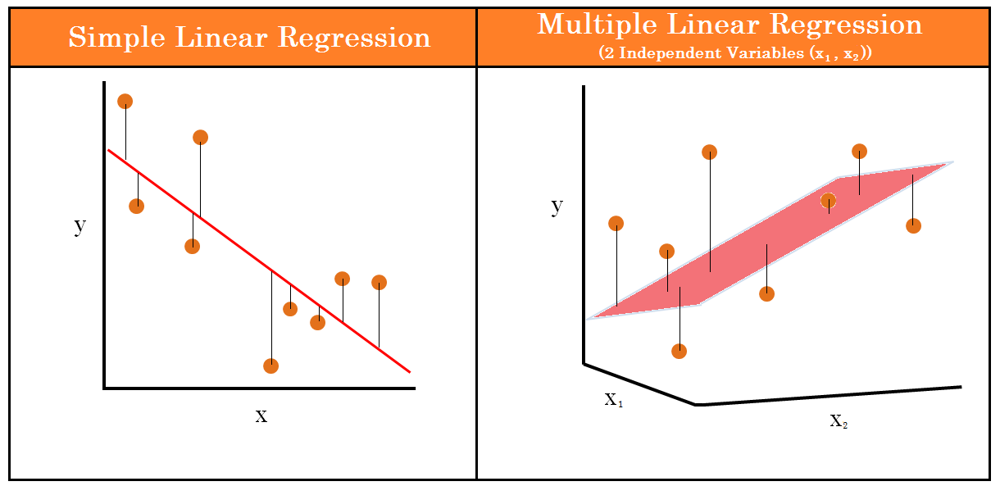

### Gradient descent

Gradient descent is een manier om de parameters van de rechte / hypervlak te zoeken zodat de kostfunctie geminimaliseerd wordt. Begin met random waarden, bereken de kostfunctie. Iteratief wordt in elke stap de waarden voor de parameters gewijzigd zodat de fout telkens kleiner wordt. 

Deze wijziging gebeurt aan de hand van **de gradiënt** van die parameter : de afgeleide van de MRE naar die parameter. 


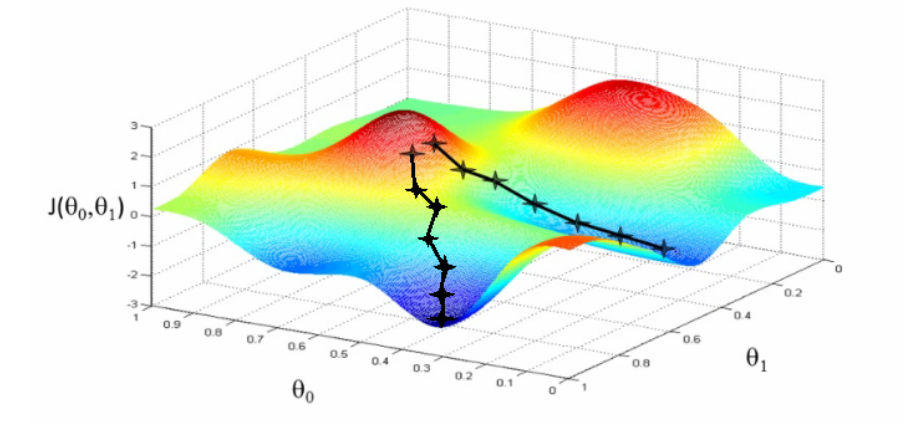


**Goed nieuws** : $sklearn$ module bevat een $\bf{LineairRegression}$ model dat automatisch 
    de coëfficienten van de rechte (of het hypervlak) zoekt via minimalisatie van 
    de MSE functie !

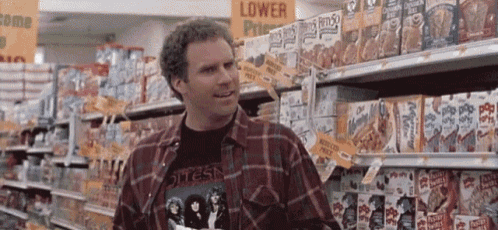
    

#### LineairRegression in Python / sklearn

#### artificial wave datset

1 feature -> enkelvoudige lineair regressie

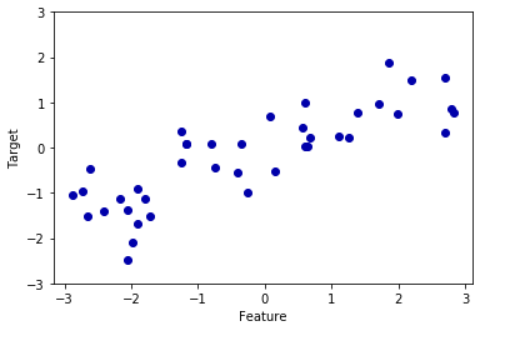

In [7]:
import numpy as np
def make_wave(n_samples=100):
    rnd = np.random.RandomState(42)
    x = rnd.uniform(-3, 3, size=n_samples)
    y_no_noise = (np.sin(4 * x) + x)
    y = (y_no_noise + rnd.normal(size=len(x))) / 2
    return x.reshape(-1, 1), y

In [15]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

X, y = make_wave(n_samples=60)
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

lr = LinearRegression().fit(X_train, y_train)

In [11]:
print("lr.coef_:", lr.coef_)
print("lr.intercept_:", lr.intercept_)

lr.coef_: [0.39390555]
lr.intercept_: -0.031804343026759746


In [12]:
print("Training set score: {:.2f}".format(lr.score(X_train, y_train)))
print("Test set score: {:.2f}".format(lr.score(X_test, y_test)))

Training set score: 0.67
Test set score: 0.66


zowel training als test set accuracy scoort laag en gelijkaardig (geen overfitting dus - eerder underfitting)

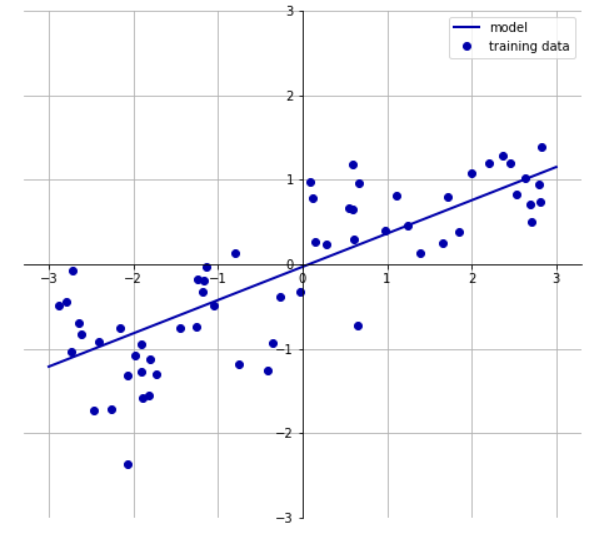

In [28]:
from sklearn.datasets import load_boston
from sklearn.preprocessing import MinMaxScaler, PolynomialFeatures
def load_extended_boston():
    boston = load_boston()
   # print(boston.DESCR)
    X = boston.data

    X = MinMaxScaler().fit_transform(boston.data)
    X = PolynomialFeatures(degree=2, include_bias=False).fit_transform(X)
    return X, boston.target


#### Boston Housing dataset 
Gekende real-world dataset uit de jaren '70 waarbij huisprijzen moeten voorspeld worden in bepaalde buurten van Boston met features zoals _crime rate_, _highway accessibility_ en _proximity to the Charles river_. In totaal zijn er 13 features en 506 datapoints. <https://towardsdatascience.com/linear-regression-on-boston-housing-dataset>

**Data Set Characteristics:**  

    :Number of Instances: 506 

    :Number of Attributes: 13 numeric/categorical predictive. Median Value (attribute 14) is usually the target.

    :Attribute Information (in order):
        - CRIM     per capita crime rate by town
        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.
        - INDUS    proportion of non-retail business acres per town
        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
        - NOX      nitric oxides concentration (parts per 10 million)
        - RM       average number of rooms per dwelling
        - AGE      proportion of owner-occupied units built prior to 1940
        - DIS      weighted distances to five Boston employment centres
        - RAD      index of accessibility to radial highways
        - TAX      full-value property-tax rate per $10,000
        - PTRATIO  pupil-teacher ratio by town
        - B        1000(Bk - 0.63)^2 where Bk is the proportion of blacks by town
        - LSTAT    % lower status of the population
        - MEDV     Median value of owner-occupied homes in $1000's

    :Missing Attribute Values: None


In [29]:
X, y = load_extended_boston()

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)
lr = LinearRegression().fit(X_train, y_train)

In [30]:
print("Training set score: {:.2f}".format(lr.score(X_train, y_train)))
print("Test set score: {:.2f}".format(lr.score(X_test, y_test)))

Training set score: 0.95
Test set score: 0.61


De discrepancy tussen test en training accuracy duidt nu wel duidelijk op **overfitting** ! -> zie verder **regularizatie** 

### Reminder : overfitting

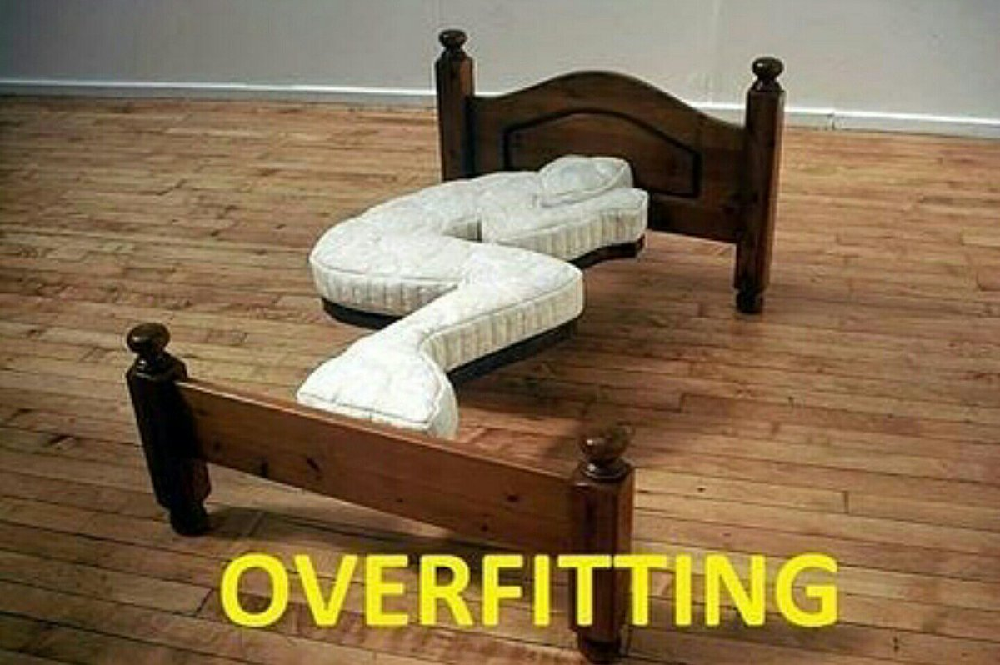

### Correlatie

* Correlatie drukt de samenhang tussen 2 variabelen uit. Deze kan : 
    - postief zijn (beide variabelen veranderen samen in dezelfde richting), 
    - negatief zijn (ze varieren in tegenovergestelde richting) of 
    - niet bestaan

* De mate van correlatie tussen twee variabelen wordt uitgedrukt in de **correlatiecoëfficiënt**. De waarde daarvan kan variëren tussen $–1$ en $+1$. Daarbij betekent 
    _ 0: geen lineaire samenhang, 
    _ +1: een perfecte positieve lineaire samenhang 
    –  1: een perfecte negatieve lineaire samenhang. 
    
    Hoe verder de correlatiecoëfficiënt verwijderd is van 0, hoe sterker de correlatie. zie bvb **de Pearson correlatiecoëfficiënt** die je kan berekenen via steekproeven.

* Let wel : Een correlatiecoëfficiënt van 0 wil zeggen dat er totaal geen lineaire samenhang is. Er kan echter wel een kwadratisch of ander verband zijn.



### Correlatie en causaliteit

Een correlatie kan je niet gebruiken om **causaliteit (oorzaak-verband)** te bewijzen. Je kan dit ook niet met regressie, maar een aanwezige correlatie kan je wel gebruiken om regressie (voorspellingen te gaan doen)

Er blijkt de voorbije jaren een correlatie te zijn tussen de afstand tussen de Aarde en de komeet van Halley en de benzineprijs. Deze correlatie is zeer sterk, en het is duidelijk dat er geen oorzakelijk verband is.

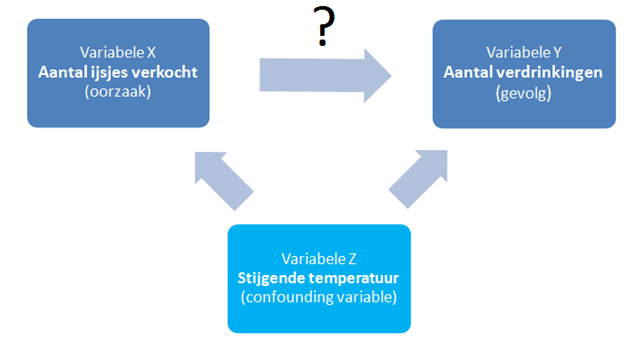

<http://www.psyblog.nl/2014/02/06/correlatie-causaliteitijsjes-piraten-en-de-media/>


#### Correlatiematrix van de Boston Housing dataset

In dit model werd er rekening gehouden met alle aanwezige features. Hoe kunnnen de meest relevante features gevonden worden?
Bereken voor elke 2 features hun correlatie.
De **correlatiematrix kan aantonen welke features hoog gecorreleerd zijn met de target feature** (MEDV). Bijvoorbeeld feature RM heeft een sterke positieve correlatie $0.7$, terwijl LSTAT een hoge negatieve correlatie heeft met MDEV : $-0.74$.
Wanneer **2 features onderling hoog gecorreleerd** zijn, hoef je maar 1 van de 2 in het voorspellend model te gebruiken : bvb RAD en TAX zijn onderling gecorreleerd met $0.91$

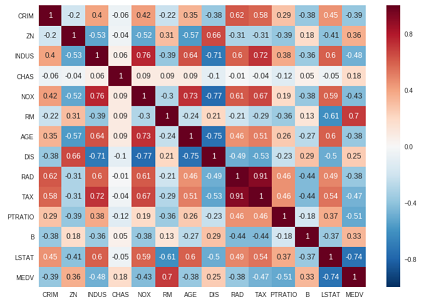


### Regularization : Ridge Regression

Regularizatie legt **extra voorwaarden** op aan het minimalisatieproces om overfitting te vermijden. Dus de coëfficienten moeten zo gekozen worden dat de kostfunctie nog steeds minimaal blijft; maar hierbovenop wil men ook de complexiteit van het model zelf verminderen (en dus het model algemener maken). 

Dit kan bv. door de coëfficienten $a_j$ zo klein mogelijk te kiezen : **elke coëfficient $a_i$ moet zo dicht mogelijk tegen $0$ gekozen worden zonder de kwaliteit van het resultaat te verminderen**. Een feature moet m.a.w. een zo klein mogelijke invloed op het resultaat uitoefenen zonder aan kwaliteit in te boeten. (de helling moet dus zo klein mogelijk gehouden worden). 

- Wiskundig kan men dit bereiken door ook de som van de kwadraten van de coëfficienten te minimaliseren.Deze regularizatie wordt **Ridge regression** of  $\bf{L2}$ **regularizatie** genoemd. 

\begin{equation}
MIN(MSE) = MIN(\frac{1}{n} \sum_{i=1}^{grootte\;datset} (y_i - \sum_{j=0}^{n=nr features} a_j * x_{ij})^2 + \alpha \sum_{j}^{n}a_{j}^2
\end{equation}

Dit geeft een **extra parameter** $\bf{\alpha}$ waarmee het model kan aangepast worden (lees verbeterd worden cfr het aantal buren bij K-NN). Hoe kleiner $\alpha$ gekozen wordt, hoe dichter het model aanleunt bij het klassieke lineaire regressiemodel




### Ridge Regression : Boston Housing Dataset

In [33]:
from sklearn.linear_model import Ridge

ridge = Ridge().fit(X_train, y_train)
print("Training set score: {:.2f}".format(ridge.score(X_train, y_train)))
print("Test set score: {:.2f}".format(ridge.score(X_test, y_test)))

Training set score: 0.89
Test set score: 0.75


In [34]:
ridge10 = Ridge(alpha=10).fit(X_train, y_train)
print("Training set score: {:.2f}".format(ridge10.score(X_train, y_train)))
print("Test set score: {:.2f}".format(ridge10.score(X_test, y_test)))

Training set score: 0.79
Test set score: 0.64


In [35]:
ridge01 = Ridge(alpha=0.1).fit(X_train, y_train)
print("Training set score: {:.2f}".format(ridge01.score(X_train, y_train)))
print("Test set score: {:.2f}".format(ridge01.score(X_test, y_test)))

Training set score: 0.93
Test set score: 0.77


Waarden van de coëfficienten voor verschillende $\alpha$

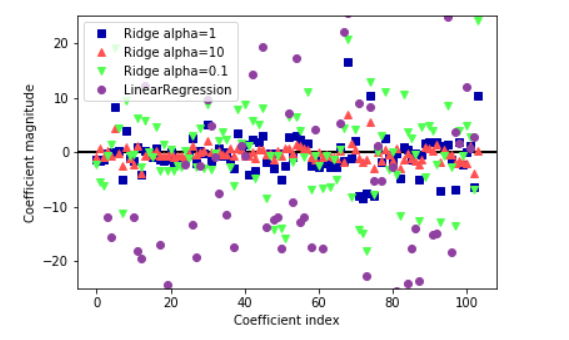

###### Ridge versus Lineair regression:

- de score op de trainingset is bij beide hoger dan deze van de test set

- de score op de trainingset is hoger bij lineaire regressie (wegens overfitting) maar de score op de test set is beter bij Ridge !

- Lineaire regressie heeft veel datapunten nodig om effectief iets te leren (pas vanaf 400 datapunten). Ridge scoort dus veel beter op kleinere datsets.

- De regularizatie wordt minder belangrijk naarmate de grootte van de dataset toeneemt ! De rede hiervoor is dat overfitting minder kans heeft bij grotere datsets.

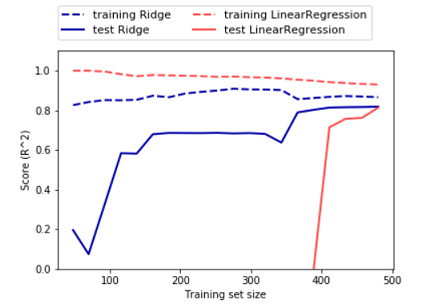

### Regularization : Lasso Regression

* ook hier is het idee om de coëfficienten zo klein mogelijk te kiezen. Alleen bij **Lasso Regressie** of **L1 regularizatie** gebeurt dit door de som van de absolute waarden van de coëfficienten te minimaliseren ipv de kwadraten, dit geeft in wiskunde : 

\begin{equation}
MIN(MSE) = MIN(\frac{1}{n} \sum_{i=1}^{grootte\;datset} (y_i - \sum_{j=0}^{n=nr features} a_j * x_{ij})^2 + \alpha \sum_{j}^{n}|a_{j}|
\end{equation}

Dezelfde extra parameter $\alpha$ kan gebruikt worden om het model beter te leren instellen. 

Het grote verschil met Ridge regressie is dat de coëfficienten nu daadwerkelijk $0$ kunnen worden en er dus features geëlimineerd worden! Lasso regressie kan dus gezien worden als een **feature selectie techniek**

### Lasso Regression : Boston Housing Dataset

In [39]:
from sklearn.linear_model import Lasso

lasso = Lasso().fit(X_train, y_train)
print("Training set score: {:.2f}".format(lasso.score(X_train, y_train)))
print("Test set score: {:.2f}".format(lasso.score(X_test, y_test)))
print("Number of features used:", np.sum(lasso.coef_ != 0))

Training set score: 0.29
Test set score: 0.21
Number of features used: 4


In [40]:
# we increase the default setting of "max_iter",
# otherwise the model would warn us that we should increase max_iter.
lasso001 = Lasso(alpha=0.01, max_iter=100000).fit(X_train, y_train)
print("Training set score: {:.2f}".format(lasso001.score(X_train, y_train)))
print("Test set score: {:.2f}".format(lasso001.score(X_test, y_test)))
print("Number of features used:", np.sum(lasso001.coef_ != 0))

Training set score: 0.90
Test set score: 0.77
Number of features used: 33


In [38]:
lasso00001 = Lasso(alpha=0.0001, max_iter=100000).fit(X_train, y_train)
print("Training set score: {:.2f}".format(lasso00001.score(X_train, y_train)))
print("Test set score: {:.2f}".format(lasso00001.score(X_test, y_test)))
print("Number of features used:", np.sum(lasso00001.coef_ != 0))

Training set score: 0.95
Test set score: 0.64
Number of features used: 96


#### Lasso versus Ridge

- Ridge $(\alpha = 0.1)$ presteert gelijkwaardig als Lasso ($\alpha = 0.01)$ alleen heeft Lasso veel minder features gebruikt!

- Lasso geeft je een minder complex model doordat minder features gebruikt worden (vele coëfficienten worden 0). Wanneer er niet zoveel features zijn wordt Ridge geprefereerd.

- Soms worden beide regularizaties samen gebruikt.

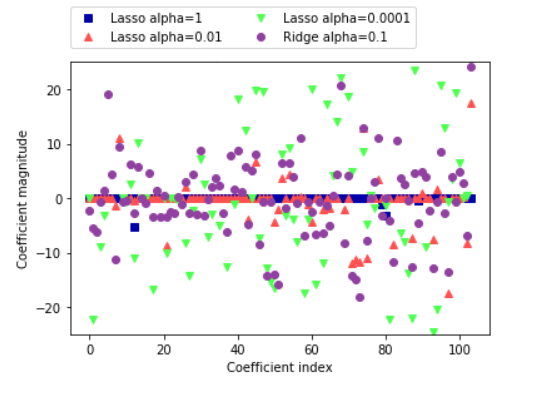


### Lineaire modellen voor Classificatie

### Binaire Classificatie

De taak is nu om een rechte of hypervlak te vinden die zal optreden als grens om beslissingen te nemen omtrent classificatie. Deze rechte of hypervlak noemt men ook wel **decision boundaries**. Data die perfect voospeld kan worden door lineaire modellen noemt men **lineair separeerbaar**. 

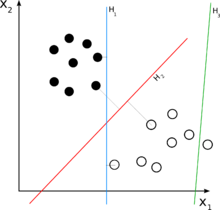


#####  Een hypervlak als decision boundary

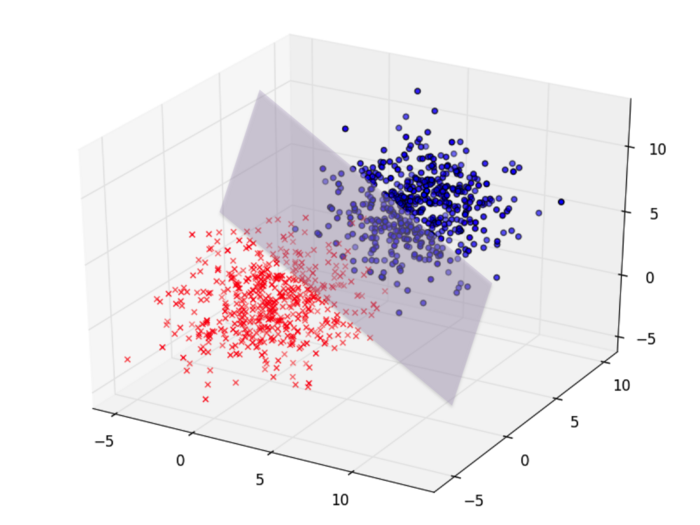

#### Modelrepresentatie voor binaire classificatie

De vergelijking van een rechte / hyperplane wordt nu op de volgende manier gebruikt :
      
\begin{equation}
y_{predict} = a_0 + a_1 * x_1 + a_2 * x_2 , \ldots , + a_n * x_n > 0
\end{equation}

Wanneer de voorspelde waarde $y$ postief is zal de klasse $+1 / ja $ voorspeld worden, 
indien ze negatief is zal de klasse $-1 / neen$ voorspeld worden. 

Opnieuw moeten de coëfficienten $a_j$ gezocht worden om hier het aantal misclassificaties te minimaliseren (i.p.v. een kostfunctie minimaliseren, spreekt men hier van een loss-functie) 



### LogisticRegression

Ondanks zijn naam is het wel degelijk een classifcatiealgoritme. 

     
\begin{equation}
y_{predict} =  ln(\frac{p_y}{1-p_y}) = a_0 + a_1 * x_1 + a_2 * x_2 , \ldots , + a_n * x_n
\end{equation}

waarbij $p_y$ = de kans op waarde $1$ voor y en dus $1-p$ = de kans op waarde $0$ voor y. 

In plaats van de parameters te zoeken die een kostfunctie minimaliseren, worden hier parameters gezocht die de likelihood op het voorkomen van de trainingsdata maximaliseren. **Maximum Likelhood optimization** zoekt deze parameters die de fouten in de kansen op de trainingsdata minimaliseren en dus de trainingsdata zou goed mogelijk verklaren.

Regularizatie kan eveneens toegepast worden om overfitting te vermijden. Hier wordt dit geregeld via parameter $C$

### Voorspellingen maken via Logistic Regression :

Stel we moeten voorspellen op basis van de lengte van een persoon of deze mannelijk of vrouwelijk is. Dit is een binaire classificatie op basis van 1 feature. We zoeken dus een waarde voor parameter $a_0$ en $a_1$. 
Stel ons leermodel geeft volgende gegevens $a_0 = -100 $ en $a_1 = 0.6$. Welke klasse wordt dan voorspeld voor een persoon die $1m50$ groot is ?

\begin{equation}
ln(\frac{p_y}{1-p_y}) = a_0 + a_1 * x_1 = -100 + 0.6 (150) = -10 \\
\frac{p_y}{1 - p_y} = EXP^{(-10)} \\
p_y = \frac{EXP^{(-10)}}{1 +EXP^{(-10)} } \\
p_y =  0.0000453978687
\end{equation}


De kans om mannelijk te zijn bij een lengte van $150cm$ is dus heel klein!
De classificatie gaat als volgt : 

\begin{equation}
p(male) < 0.5   -> 0 \\
p(male) \ge 0.5   -> 1
\end{equation}


### Multi-class Classificatie

Meestal wordt de **one versus rest** methode gebruikt. Deze doet een binaire classificatie voor elke klasse waarbij deze klasses wordt gescheiden van de rest via een lineair model. Er worden meerdere binaire classifiers geleerd. Bij voorspelling van een nieuw datapunt worden al deze binaire classifiers gebruikt om een voorspelling te doen. Deze die de hoogste kans geeft wordt gebruikt om de voorspelling te maken. 

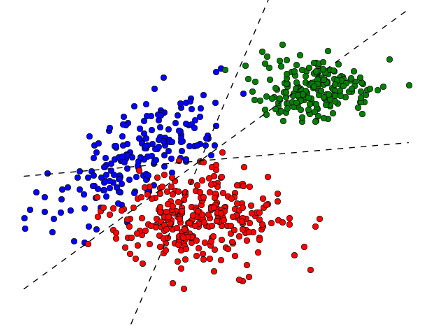

### Voorbeeld Multi-class classificatie via Logistic Regression

In [49]:
from sklearn.datasets import load_digits
digits = load_digits()
# Print to show there are 1797 images (8 by 8 images for a dimensionality of 64)
print('Image Data Shape' , digits.data.shape)
# Print to show there are 1797 labels (integers from 0–9)
print("Label Data Shape", digits.target.shape)

Image Data Shape (1797, 64)
Label Data Shape (1797,)


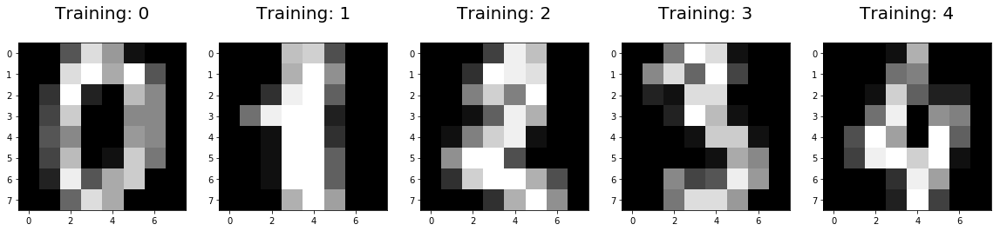

In [51]:
import numpy as np 
import matplotlib.pyplot as plt
plt.figure(figsize=(20,4))
for index, (image, label) in enumerate(zip(digits.data[0:5], digits.target[0:5])):
 plt.subplot(1, 5, index + 1)
 plt.imshow(np.reshape(image, (8,8)), cmap=plt.cm.gray)
 plt.title('Training: %i\n' % label, fontsize = 20)

In [68]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(digits.data, digits.target, test_size=0.25, random_state=0)

logisticRegr = LogisticRegression(solver='liblinear', multi_class = 'auto')
logisticRegr


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='auto',
          n_jobs=None, penalty='l2', random_state=None, solver='liblinear',
          tol=0.0001, verbose=0, warm_start=False)

In [69]:
logisticRegr.fit(x_train, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='auto',
          n_jobs=None, penalty='l2', random_state=None, solver='liblinear',
          tol=0.0001, verbose=0, warm_start=False)

In [70]:

print(logisticRegr.predict(x_test[0].reshape(1,-1)))
print(logisticRegr.predict(x_test[0:10]))

[2]
[2 8 2 6 6 7 1 9 8 5]


In [71]:
score = logisticRegr.score(x_test, y_test)
print(score)

0.9533333333333334


### Samenvatting van lineaire modellen

* **Parameters** : 
  - de **regularizatie parameters $\alpha$ en $C$**. Hoe groter deze waarden hoe simpeler het model. 
  - keuze tussen **$L1$ of $L2$ regularizatie**. $L1$ is in staat om feautures te elimineren en is dus interessant in grote feauture ruimten
  
  
* **Eigenschappen van lineaire modellen** : 
    - training is snel, voorspellen is snel
    - schalen heel goed naar grote en sparse datasets (zie solver option)
    - schalen ook heel goed wanneer het aantal features groot is t.o.v. het aantal elementen in de dataset
    - bij kleinere feature ruimten zijn er betere technieken om te generalizeren
    - eenvoudig begrijpbaar indien de features onderling niet te hard gecorrelleerd zijn, dan zijn de gewichten / inbreng van elke feature af te lezen uit het model

### Inductive Bias 

Elk ML algoritme dat in staat is om te generalizeren over de trainingsdata heen draagt een zekere bias met zich mee. Dit is een algoritme bias, of **inductieve bias**.


- K-NN : de classificatie van een datapunt wordt verondersteld om gelijkaardig te zijn aan dat van zijn buren, dit zijn andere datapunten uit de trainingsset die dichtbij zijn volgens typisch de Euclidische afstandsmaat

- Lineaire modellen : men veronderstelt een lineair verband tussen de features en de target, of men veronderstelt dat de datapunten lineair separeerbaar zijn (classificatie). Dit heeft als gevolg dat data soms _voorbereid_ moet worden :
    - data moet soms eerst _getransformeerd_ worden om de relatie _lineairder_  te maken bvb door een log transformatie maakt iets exponentieels lineair
    - Verwijder **outliers** en **noise** uit de data
    - Verwijder **co-lineariteit** : bereken de pairwise correlations van features en verwijder de meest gecorreleerde features
    - Herschaal input data via **normalisatie**
   

### Bias : verschillende vormen

1. Sample Bias
2. Prejudice bias
3. Measurement Bias
4. Algorithm bias

<https://thenextweb.com/contributors/2018/10/27/4-human-caused-biases-machine-learning/>

### Referenties :

- Introduction to Machine Learning Algorithms: Linear Regression <https://towardsdatascience.com/introduction-to-machine-learning-algorithms-linear-regression-14c4e325882a>

- Linear Regression for Machine Learning <https://machinelearningmastery.com/linear-regression-for-machine-learning/>

- Linear Regression on Boston Housing Dataset 
<https://towardsdatascience.com/linear-regression-on-boston-housing-dataset-f409b7e4a155>

- Ridge and Lasso Regression: A Complete Guide with Python Scikit-Learn
    <https://towardsdatascience.com/ridge-and-lasso-regression-a-complete-guide-with-python-scikit-learn-e20e34bcbf0b>
        
- Logistic Regression using Python (scikit-learn) <https://towardsdatascience.com/logistic-regression-using-python-
    sklearn-numpy-mnist-handwriting-recognition-matplotlib-a6b31e2b166a>
